In [2]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import torch.nn as nn
from collections import namedtuple
# from bokeh.plotting import figure, show, row, output_notebook
# from bokeh.plotting import output_notebook
# output_notebook()
import tqdm
# import seaborn as sns
from matplotlib.colors import ListedColormap
import matplotlib as mpl
import scipy.signal as sig
import pandas as pd


In [3]:
class SurrGradSpike(torch.autograd.Function):
    """
    Here we implement our spiking nonlinearity which also implements
    the surrogate gradient. By subclassing torch.autograd.Function,
    we will be able to use all of PyTorch's autograd functionality.
    Here we use the normalized negative part of a fast sigmoid
    as this was done in Zenke & Ganguli (2018).
    """

    scale = 20.0  # controls steepness of surrogate gradient

    @staticmethod
    def forward(ctx, input):
        """
        In the forward pass we compute a step function of the input Tensor
        and return it. ctx is a context object that we use to stash information which
        we need to later backpropagate our error signals. To achieve this we use the
        ctx.save_for_backward method.
        """
        ctx.save_for_backward(input)
        return (input > 0.).float()

    @staticmethod
    def backward(ctx, grad_output):
        """
        In the backward pass we receive a Tensor we need to compute the
        surrogate gradient of the loss with respect to the input.
        Here we use the normalized negative part of a fast sigmoid
        as this was done in Zenke & Ganguli (2018).
        """
        input, = ctx.saved_tensors
        grad_input = grad_output.clone()
        grad = grad_input / (SurrGradSpike.scale * torch.abs(input) + 1.0) ** 2
        return grad


activation = SurrGradSpike.apply

# Defining models
## LIF model

In [4]:
class LIF_neuron(nn.Module):
    NeuronState = namedtuple('NeuronState', ['V', 'I','count_refr'])

    def __init__(self, parameters):
        super(LIF_neuron, self).__init__()
        self.C = parameters['C_Osc']
        self.thr = parameters['v_Osc_threshold']
        self.state = None
        self.bs = parameters['trials_per_stimulus']
        self.n = parameters['neurons_n']
        self.tau_syn = parameters['tau_Osc_Ie']
        self.tau_neu = parameters['tau_Osc']
        self.gain_syn = parameters['TDE_to_Osc_current']
        self.dt = parameters['clock_sim']
        self.Vr = parameters['reset_osc']
        self.device = parameters['device']
        self.I_minimum_osc = parameters['I_minimum_osc']
        self.I_step_osc = parameters['I_step_osc']
        self.refrac_Osc = parameters['refrac_Osc']
        self.steady_current = torch.tensor([self.I_minimum_osc + self.I_step_osc * i for i in range(self.n)]).to(self.device)
        self.refr = self.refrac_Osc/self.dt

    def initialize_state(self,parameters):
        self.state = None
        self.bs = parameters['trials_per_stimulus']
    def forward(self, input):
        if self.state is None:
            self.state = self.NeuronState(V=torch.ones((self.bs,self.n), device=input.device),
                                          I=torch.zeros((self.bs,self.n), device=input.device),
                                          count_refr = torch.zeros((self.bs,self.n), device=input.device)
                                          )
        V = self.state.V
        I = self.state.I
        count_refr = self.state.count_refr
        I += -self.dt * I / self.tau_syn + self.gain_syn * input
        V += self.dt * (-V / self.tau_neu + (I + self.steady_current) / self.C)
        spk = activation(V - self.thr)
        count_refr = self.refr*(spk) + (1-spk)*(count_refr-1)
        V = (1 - spk) * V * (count_refr <= 0) + spk * self.Vr
        self.state = self.NeuronState(V=V, I=I,count_refr = count_refr)
        return spk

## TDE model

In [5]:
class TDE(nn.Module):
    NeuronState = namedtuple('NeuronState', ['v', 'i_trg', 'i_fac','count_refr'])

    def __init__(self, parameters):
        super(TDE, self).__init__()
        self.C = parameters['C_TDE']
        self.thr = parameters['v_TDE_threshold']
        self.state = None
        self.bs = parameters['trials_per_stimulus']
        self.n = parameters['neurons_n']
        self.tau_trg = parameters['tau_trg_TDE']
        self.tau_fac = parameters['tau_fac_TDE']
        self.gain_fac = parameters['gain_fac_TDE']
        self.gain_trg = parameters['gain_trg_TDE']
        self.beta = parameters['tau_TDE']
        self.dt = parameters['clock_sim']
        self.Vr = parameters['reset_TDE']
        self.refr = parameters['refrac_TDE']/self.dt
        self.device = parameters['device']
        # self.refr.to(self.device)

    def initialize_state(self,parameters):
        self.state = None
        self.bs = parameters['trials_per_stimulus']
    def forward(self, input_fac, input_trg):
        if self.state is None:
            self.state = self.NeuronState(v=torch.zeros(input_trg.shape, device=input_trg.device),
                                          i_trg=torch.zeros(input_trg.shape, device=input_trg.device),
                                          i_fac=torch.zeros(input_trg.shape, device=input_trg.device),
                                          count_refr = torch.zeros((self.bs,self.n), device=input_trg.device)
                                          )

        assert input_trg.shape == input_fac.shape, "TRG and FAC should have same dimensions, while: shape trg: " + str(input_trg.shape) + ", shape fac: " + str(input_fac.shape)
        v = self.state.v
        i_trg = self.state.i_trg
        i_fac = self.state.i_fac
        count_refr = self.state.count_refr
        i_fac += -self.dt / self.tau_fac * i_fac + self.gain_fac * input_fac
        i_trg += -self.dt / self.tau_trg * i_trg + self.gain_trg * input_trg * i_fac
        v += self.dt * (- v / self.beta + i_trg / self.C)
        spk = activation(v - self.thr)
        count_refr = self.refr*(spk) + (1-spk)*(count_refr-1)
        v = (1 - spk) * v * (count_refr <= 0) + spk * self.Vr
        self.state = self.NeuronState(v=v, i_trg=i_trg, i_fac=i_fac,count_refr= count_refr)
        return spk

## SPLL model

In [6]:
class sPLL(nn.Module):
    def __init__(self, parameters):
        super(sPLL, self).__init__()
        self.device = parameters['device']
        self.TDE = TDE(parameters).to(self.device)
        self.LIF = LIF_neuron(parameters).to(self.device)
        self.n_out = parameters['neurons_n']
        self.n_in = 1
        self.tmp_current_list = nn.Parameter(torch.linspace(parameters['I_minimum_osc'],parameters['I_minimum_osc'] + parameters['I_step_osc']*self.n_out,self.n_out),requires_grad=False).to(self.device)
    def initialize_state(self,parameters):
        self.LIF.initialize_state(parameters)
        self.TDE.initialize_state(parameters)
        self.bs = parameters['trials_per_stimulus']
        self.input_fac = torch.zeros((self.bs,self.n_out), device=self.device)
        self.spikes_TDE_prev = torch.zeros((self.bs,self.n_out), device=self.device).to_sparse()
        self.spikes_TDE = torch.zeros((self.bs,self.n_out), device=self.device).to_sparse()
        self.spikes_LIF = torch.zeros((self.bs,self.n_out), device=self.device).to_sparse()
        self.current_list = self.tmp_current_list*(torch.ones_like(self.input_fac).to(self.device))
        self.LIF.steady_current = self.current_list
    def forward(self, input):
        # input_expanded = input*torch.ones([input.shape[0],self.n_out]).to(self.device).T
        self.spikes_LIF = self.LIF(self.spikes_TDE_prev)
        self.spikes_TDE = self.TDE(input,self.spikes_LIF)
        self.spikes_TDE_prev = self.spikes_TDE
        return self.spikes_TDE, self.spikes_LIF

# Defining the parameters
## Defining general parameters

In [7]:
parameters = {}

In [8]:
parameters['device'] = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
# parameters['device'] = torch.device("cpu")
print('device in use:',parameters['device'])
parameters['neurons_n'] = 50
parameters['frequencies'] = 1
parameters['clock_sim'] = 0.01e-3
parameters['trials_per_stimulus'] = 1
sim_time = 1

device in use: cuda:0


## Defining LIF params

In [9]:
parameters['C_Osc'] = 1
parameters['v_Osc_threshold'] = 1
parameters['tau_Osc_Ie'] = 100e-3
parameters['tau_Osc'] = 100e-3
parameters['TDE_to_Osc_current'] = 5
parameters['reset_osc'] = 0
parameters['I_minimum_osc'] = 12
parameters['I_step_osc'] = 1
parameters['refrac_Osc'] = 1e-3
parameters['trials_per_stimulus'] = 1

## Defining TDE params

In [10]:
parameters['C_TDE'] = 1
parameters['v_TDE_threshold'] = 1
parameters['tau_trg_TDE'] = 1e-3
parameters['tau_fac_TDE'] = 5e-3
parameters['gain_fac_TDE'] = 1
parameters['gain_trg_TDE'] = 100000
parameters['reset_TDE'] = 0
parameters['tau_TDE'] = 10e-3
parameters['refrac_TDE'] = 1e-3
parameters['trials_per_stimulus'] = 1

## Defining SPLL params and simulation

In [11]:
parameters['TDE_to_Osc_current'] = 1

In [12]:
def sim_sPLL(freqs,in_spikes,break_feedback = False,parameters_here = [],save_traces = False):
    torch.cuda.empty_cache()
    spk_tde = []
    spk_osc = []
    v_tde = []
    v_osc = []
    i_trg = []
    i_fac = []
    i_syn = []
    # for j in range(len(freqs)):
    #     isi = torch.diff(torch.where(in_spikes[:,j,0])[0])*parameters['clock_sim']
    #     print('Frequency: ',1/torch.mean(isi).item(),' Hz')
    if len(parameters_here) == 0:
        parameters_here = parameters
    parameters_here['trials_per_stimulus'] = in_spikes.shape[1]
    sPLL_test = sPLL(parameters_here)
    sPLL_test.initialize_state(parameters = parameters_here)
    sim_loop = tqdm.trange(int(sim_time/parameters_here['clock_sim']),desc='Simulating sPLL')
    spk_tde_collect = []
    spk_osc_collect = []
    v_tde_collect = []
    v_osc_collect = []
    i_trg_collect = []
    i_fac_collect = []
    i_syn_collect = []
    with torch.no_grad():
        for i in sim_loop:
            spk_tde_tmp,spk_osc_tmp = sPLL_test(in_spikes[i])
            if break_feedback == True:
                sPLL_test.spikes_TDE_prev = torch.zeros_like(sPLL_test.spikes_TDE_prev)
            spk_tde.append(spk_tde_tmp)
            spk_osc.append(spk_osc_tmp)
            if save_traces == True:
                v_tde.append(sPLL_test.TDE.state.v)
                v_osc.append(sPLL_test.LIF.state.V)
                i_trg.append(sPLL_test.TDE.state.i_trg.clone().detach())
                i_fac.append(sPLL_test.TDE.state.i_fac.clone().detach())
                i_syn.append(sPLL_test.LIF.state.I.clone().detach())
            if (((i-1)%1000000 == 0)):
                # sim_loop.set_description('Simulating SPLL: {} ms'.format(i*parameters['clock_sim']*1000))
                spk_tde_collect.append(torch.stack(spk_tde).cpu().detach())
                spk_osc_collect.append(torch.stack(spk_osc).cpu().detach())
                if save_traces:
                    v_tde_collect.append(torch.stack(v_tde).cpu().detach())
                    v_osc_collect.append(torch.stack(v_osc).cpu().detach())
                    i_trg_collect.append(torch.stack(i_trg).cpu().detach())
                    i_fac_collect.append(torch.stack(i_fac).cpu().detach())
                    i_syn_collect.append(torch.stack(i_syn).cpu().detach())
                spk_tde = []
                spk_osc = []
                v_tde = []
                v_osc = []
                i_trg = []
                i_fac = []
                i_syn = []
                torch.cuda.empty_cache()
        spk_tde_collect.append(torch.stack(spk_tde).cpu().detach())
        spk_osc_collect.append(torch.stack(spk_osc).cpu().detach())
        if save_traces:
            v_tde_collect.append(torch.stack(v_tde).cpu().detach())
            v_osc_collect.append(torch.stack(v_osc).cpu().detach())
            i_trg_collect.append(torch.stack(i_trg).cpu().detach())
            i_fac_collect.append(torch.stack(i_fac).cpu().detach())
            i_syn_collect.append(torch.stack(i_syn).cpu().detach())
        #i added these lines to make sure everything gets cleared properly
        del spk_tde,spk_osc,v_tde,v_osc,i_trg,i_fac,i_syn
        torch.cuda.empty_cache()
        
        spk_tde = torch.concat(spk_tde_collect,dim = 0)
        spk_osc = torch.concat(spk_osc_collect,dim = 0)
        if save_traces:
            v_tde = torch.concat(v_tde_collect,dim = 0)
            v_osc = torch.concat(v_osc_collect,dim = 0)
            i_trg = torch.concat(i_trg_collect,dim = 0)
            i_fac = torch.concat(i_fac_collect,dim = 0)
            i_syn = torch.concat(i_syn_collect,dim = 0)
            return spk_tde,spk_osc,v_tde,v_osc,i_trg,i_fac,i_syn
        else:
            return spk_tde,spk_osc



In [13]:
def generate_one_freq(f_ix, freq, trial_n, sim_time, clock_sim, noise=0, shift=0):
    trial_vec = torch.linspace(0, trial_n - 1, trial_n)
    trials = torch.ones([np.ceil(sim_time * freq).astype(int) + 1, trial_n])

    time_array_temp = torch.linspace(0, sim_time / clock_sim * freq,
                                     np.ceil(sim_time * freq).astype(int) + 1) * clock_sim / freq
    #print(time_array_temp)
    time_array = trials.T * time_array_temp
    shift = torch.rand(trial_n) * shift / freq
    shift = shift.unsqueeze(1).repeat(1, time_array.shape[1])
    check = (torch.randn(time_array.shape) * noise / freq) + noise / freq + shift
    time_array_noisy = time_array + check
    # plt.eventplot(time_array_noisy)
    # plt.show()
    freq_array = torch.ones(time_array.shape) * f_ix
    trial_array = (torch.ones(time_array.shape).T * trial_vec).T
    labels = torch.ones(trial_n) * f_ix
    time_array_noisy = time_array_noisy.flatten()
    freq_array = freq_array.flatten()
    trial_array = trial_array.flatten()
    return time_array_noisy, freq_array, trial_array, labels


def generate_freqs(f1, f2=[], trials_n=1, sim_time=1, sampling_freq=1000, noise=0, shift=0):
    data_combined = []
    labels_combined = []
    time_list = []
    trials_list = []
    labels_list = []
    time_list_combined = []
    trials_list_combined = []

    for fr_ix in range(len(f1)):
        freq = f1[fr_ix]
        time, _, trials, labels = generate_one_freq(fr_ix, freq, trials_n, sim_time, 1 / sampling_freq, noise, shift)
        time_pos = time > 0
        time = time[time_pos]
        trials = trials[time_pos]
        correct_idx = torch.argsort(time)
        time = time[correct_idx]
        trials = trials[correct_idx]
        time_list.append(time)
        trials_list.append(trials)
        labels_list.append(labels)
        # print(fr_ix)
        data_combined.append(
            torch.sparse_coo_tensor(indices=torch.stack([(time * sampling_freq).to(torch.int), trials]),
                                    values=torch.ones_like(time).float(),
                                    size=torch.Size([int(sim_time * sampling_freq), trials_n])).to_dense())
        # print(data_combined[-1])
        labels_combined.append(labels)
        # print('fr1',f1[fr_ix])
    if len(f2) > 0:
        # print('Generating now f2')
        data_combined = []
        labels_combined = []
        for fr_ix in range(len(f2)):
            # print(f1)
            freq = f2[fr_ix]
            time, _, trials, labels = generate_one_freq(fr_ix, freq, trials_n, sim_time, 1 / sampling_freq, noise,
                                                        shift)
            time_pos = time > 0
            time = time[time_pos]
            trials = trials[time_pos]
            for fr_ix2, freq2 in enumerate(f1):
                time = torch.cat((time_list[fr_ix2], time))
                trials = torch.cat((trials_list[fr_ix2], trials))
                correct_idx = torch.argsort(time)
                time = time[correct_idx]
                trials = trials[correct_idx]
                time_list_combined.append(time)
                trials_list_combined.append(trials)
                data_combined.append(
                    torch.sparse_coo_tensor(indices=torch.stack([(time * sampling_freq).to(torch.int), trials]),
                                            values=torch.ones_like(time).float(),
                                            size=torch.Size([int(sim_time * sampling_freq), trials_n])).to_dense())
                labels_combined.append(labels * (len(freqs) - 1) + labels_list[fr_ix2])
                # print('label',labels * len(freqs) + labels_list[fr_ix2])
                # print('fr2',f2[fr_ix], 'fr1',f1[fr_ix2])
    return data_combined, labels_combined

In [14]:
def plot_spll_run(in_spikes,spk_tde,spk_osc,i_syn,i_fac,i_trg,freqs = [],suptitle='',cmap = 'Greens',xlims=[],ylims_isi=[],select_spll = [],moving_avg = 1):
    if len(select_spll) == 0:
        select_spll = np.arange(0,in_spikes.shape[2])
    events_in = torch.where(in_spikes)
    events_tde = torch.where(spk_tde)
    events_osc = torch.where(spk_osc)
    stimuli = torch.unique(events_osc[1])

    max = 5
    print(len(stimuli))
    if len(stimuli) < max:
        max = len(stimuli)
    if len(stimuli) == 1:
        max = 2
    print(max)
    fig1,axis1 = plt.subplots(8,max,figsize = (16,16),sharex='all',sharey='row')
    if suptitle != '':
        fig1.suptitle(suptitle)
    axis1[0,0].set_ylabel('IN Spikes')
    axis1[1,0].set_ylabel('TDE Spikes')
    axis1[2,0].set_ylabel('TDE moving avg')
    axis1[3,0].set_ylabel('OSC Spikes')
    axis1[4,0].set_ylabel('I SYN')
    axis1[5,0].set_ylabel('I FAC')
    axis1[6,0].set_ylabel('I TRG')
    axis1[7,0].set_ylabel('1/ISI')
    events_in_selected = [events_in[0][torch.where(events_in[2] == 0)],events_in[1][torch.where(events_in[2] == 0)]]
    kernel = moving_avg
    sma = nn.AvgPool1d(kernel_size=kernel, stride = 1)

    if len(xlims) > 0:
        axis1[0,0].set_xlim(xlims)
    if len(ylims_isi) > 0:
        axis1[7,0].set_ylim(ylims_isi)
    for stimulus in stimuli[0:max]:
        events_in_selected_stimulus = events_in_selected[0][torch.where(events_in_selected[1]==stimulus)]

        isi_in = torch.diff(events_in_selected_stimulus)
        events_tde_selected = [events_tde[0][torch.where(events_tde[1]==stimulus)],events_tde[2][torch.where(events_tde[1]==stimulus)]]
        events_osc_selected = [events_osc[0][torch.where(events_osc[1]==stimulus)],events_osc[2][torch.where(events_osc[1]==stimulus)]]
        axis1[0,stimulus].scatter(events_in_selected_stimulus.cpu().detach().numpy(),torch.ones_like(events_in_selected_stimulus).cpu().detach().numpy(),marker='.')
        axis1[1,stimulus].scatter(events_tde_selected[0].cpu().detach().numpy(),(events_tde_selected[1]).cpu().detach().numpy(),marker='.')
        if len(freqs) > 0:
            axis1[0,stimulus].set_title(str(freqs[stimulus]) + ' Hz')
        moving_average_tde = sma(spk_tde[:,stimulus,:])
        axis1[2,stimulus].plot(moving_average_tde.cpu().detach().numpy())
        axis1[3,stimulus].scatter(events_osc_selected[0].cpu().detach().numpy(),(events_osc_selected[1]).cpu().detach().numpy(),marker='.')
        axis1[4,stimulus].plot(i_syn[:,stimulus,:].cpu().detach().numpy())
        axis1[5,stimulus].plot(i_fac[:,stimulus,:].cpu().detach().numpy())
        axis1[6,stimulus].plot(i_trg[:,stimulus,:].cpu().detach().numpy())
        #calculate isi
        for neuron in select_spll:
            events_cco_here = events_osc_selected[0][(torch.where(events_osc_selected[1]==neuron))]
            isi_cco = torch.diff(events_cco_here)
            axis1[7,stimulus].plot(events_cco_here[:-1],1/(isi_cco.cpu().detach().numpy()*parameters['clock_sim']),marker='x')
        axis1[7,stimulus].plot(events_in_selected_stimulus[:-1].cpu().detach().numpy(),1/(isi_in*parameters['clock_sim']).cpu().detach().numpy(),linestyle='--',color='k',marker='x')
    spk_tde_sum = torch.sum(spk_tde,dim=0).cpu().detach().numpy()
    spk_tde_sum_norm = spk_tde_sum.T/np.max(spk_tde_sum,axis=1)
    spk_tde_sum_norm = spk_tde_sum_norm.T#/basic_freqs
    spk_tde_sum_avg = np.average(spk_tde_sum_norm,axis=0)*1.5
    plt.figure()
    plt.imshow(spk_tde_sum_norm/spk_tde_sum_avg[None,:],aspect='auto',cmap=cmap,vmax=1)
    # plt.xticks([i for i in range(spk_tde_sum_w.shape[1])][:-1:10],[int(basic_freqs[i]) for i in range(0,spk_tde_sum_w.shape[1]-1,10)])
    # plt.yticks([i for i in range(spk_tde_sum_w.shape[0])][::10],freqs[::10])
    plt.colorbar()

# TEXTURE DETECTION

In [15]:
#tesses spike toollkit
def generate_1_freq(freq,time,rate,pw):
    period=1/freq
    spiketimes = np.arange(0,time,period)[1:] #we don't want the spike at 0
    risetimes = spiketimes-pw/2
    falltimes = spiketimes+pw/2
    times = np.linspace(0,time,int(time*rate))
    volts = np.logical_or.reduce([np.logical_and(times>risetimes[i],times<falltimes[i])for i in range(len(spiketimes))])
    return times, volts

def generate_multi_freq(freqs,time,rate,pw):
    times = np.linspace(0,time,int(time*rate))
    volts = np.zeros(len(times))
    for freq in freqs:
        loctimes,locvolts = generate_1_freq(freq,time,rate,pw)
        volts = np.logical_or(volts,locvolts)
    return times,volts

def slew(volts,rate,rt,ft):
    #use np diff to find edges
    #tiems*rate -> no samples
    #linspace 0 to 1 no samples
    #loop through edges above and apply the linspace vals
    rcount = rt*rate
    fcount = ft*rate
    if rcount < 1 or fcount < 1:
        raise ValueError('ft or rt smaller than 1 sample, cant slew')
    else:
        rcount = int(rcount)
        fcount = int(fcount)

    rslew = np.linspace(0,1,rcount+1)
    fslew = np.linspace(1,0,fcount+1)
    
    diff = np.diff(volts.astype(np.int16))
    rising = np.array(np.where(diff==1))[0]+1
    falling = np.array(np.where(diff==-1))[0]+1
    voltsout = np.copy(volts).astype(float)
    for rise in rising:
        voltsout[rise-1:rise+rcount]=rslew
    for fall in falling:
        voltsout[fall-fcount:fall+1]=fslew
    
    return rising, falling, voltsout

def generate_multi_isis(freqs,time):
    spiketimes = np.array([])
    for freq in freqs:
        period = 1/freq
        spiketimes_loc = np.arange(0,time,period)[1:]
        spiketimes = np.hstack((spiketimes,spiketimes_loc))
    spiketimes = np.sort(spiketimes)
    isis = np.diff(spiketimes)
    isi_nonzero = isis[isis>=10**(-12)]
    return isi_nonzero

def compress(times, volts):
    diff = np.diff(volts)
    diffmin = np.append(diff,1)
    diffplus = np.insert(diff,0,1)
    cut = np.ones(len(slewed),dtype=bool)
    cut = np.logical_or(diffmin!=0,diffplus!=0)
    return times[cut],volts[cut]

def timestotrain(spiketimes,time,rate,pw):
    risetimes = spiketimes-pw/2
    falltimes = spiketimes+pw/2
    times = np.linspace(0,time,int(time*rate))
    volts = np.logical_or.reduce([np.logical_and(times>risetimes[i],times<falltimes[i])for i in range(len(spiketimes))])
    return times, volts

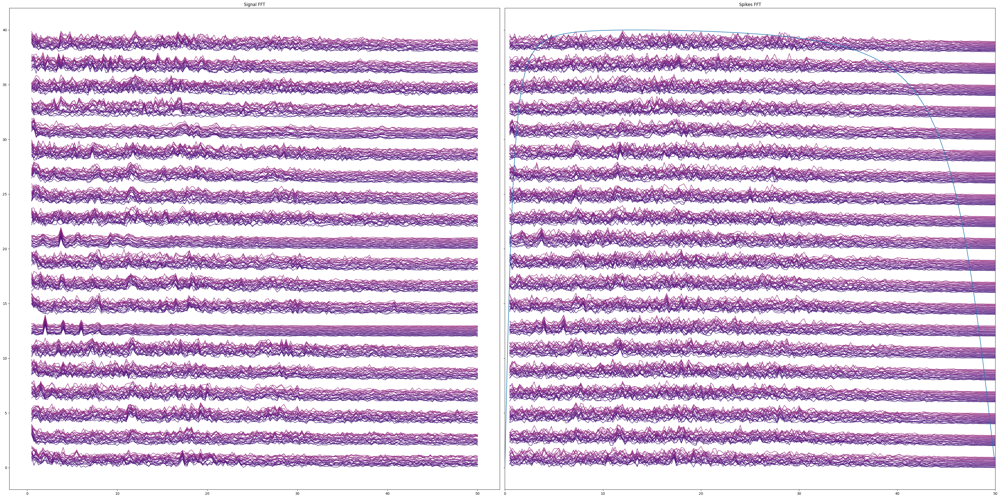

torch.Size([8000, 400, 50])
4.0


In [16]:
folder = '../BioTac_slide_20_50/raw_data/' 
sampling = 100

#the amount of samples we want to use, from the paper
samplen = 400
offset = -00
time = samplen/sampling

#samplerate of final spike array
rate = 2000
pw = 2*10**-2 #spikewidth for fft

#peak detection cutoff
cutoff = 50
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,50))
fix,(ax1,ax2)=plt.subplots(1,2,figsize=(40,20),sharey=True)

#stuff to make micheles code work
samples = 1
sample_size = int(rate*time/samples)
parameters['clock_sim'] = 1/rate
spike_coll = []
labels_coll = []

#arrays for linear regression or somn
fftsorig = []
fftsspikes = []
isis = []

#filter
b,a = sig.iirfilter(1, [1,45], btype='band', analog=False,ftype='butter', fs = sampling)

for i in range(20):
    for j in np.arange(20):
        subfolder = f'mat{i+1}/'
        file = f'mat{i+1}_{j+1}_bio.csv'
        data = pd.read_csv(folder+subfolder+file)
        datatest = data['pdc'].to_numpy()
        sampmin = int((len(datatest)-samplen)/2)+offset
        sampmax = int(len(datatest)-sampmin)+offset
        datatest = datatest[sampmin:sampmax]

        ffttest=np.fft.rfft(datatest,len(datatest))
        fftsorig.append(np.real(ffttest[:200]).flatten())
        datafreqs = np.fft.rfftfreq(len(datatest),d=1/sampling)
        ax1.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)

        datafilt = sig.filtfilt(b,a,datatest)
        peaks = np.argwhere(np.diff((datafilt>cutoff).astype('int32'),prepend=0)==1)
        # peaks_inv = np.argwhere(np.diff((datafilt<-cutoff).astype('int32'),prepend=0)==1)
        # peaks = np.concatenate((peaks,peaks_inv))
        # plt.plot(datafilt+200*i+5*j,c=colors[j],alpha=0.8)
        # plt.scatter(peaks,datafilt[peaks]+200*i+5*j)

        
        times, spike_train = timestotrain(peaks/sampling,time,rate,pw)
        ffttest=np.fft.rfft(spike_train,len(spike_train))
        fftsspikes.append(np.real(ffttest[:200]).flatten())
        datafreqs = np.fft.rfftfreq(len(spike_train),d=1/rate)
        ax2.plot(datafreqs[2:],np.abs(ffttest[2:])/np.abs(ffttest[2:]).max()+2*i+0.05*j,c=colors[j],alpha=0.8)

        #resample the whole thing
        spiketimes = peaks/sampling
        peaks = (spiketimes*rate).astype('int64') 
        #make a tensor
        peaks = np.sort(peaks).flatten()
        isis.append(np.diff(peaks))
        peaks = torch.tensor(peaks)
        spike_coll.append(torch.sparse_coo_tensor(peaks.unsqueeze(0),torch.ones_like(peaks),size=([sample_size])).to_dense())
        labels_coll.append(i)
        
ax2.set_xlim(0,50)

freqplotter = lambda w, h: ax2.plot(w, abs(h)*40)
w, h = sig.freqz(b, a,plot=freqplotter,fs=sampling)

ax1.set_title('Signal FFT')
ax2.set_title('Spikes FFT')
plt.tight_layout()
plt.show()


in_spikes_t = torch.stack(spike_coll,dim=0)
in_spikes_t = in_spikes_t.T.unsqueeze(2)*torch.ones((1,1,parameters['neurons_n']))
sim_time = in_spikes_t.shape[0]*parameters['clock_sim']
in_spikes_t[in_spikes_t>0] = 1
in_spikes_t = in_spikes_t.to(parameters['device'])
print(in_spikes_t.shape)
print(sim_time)

In [ ]:
spike_coll

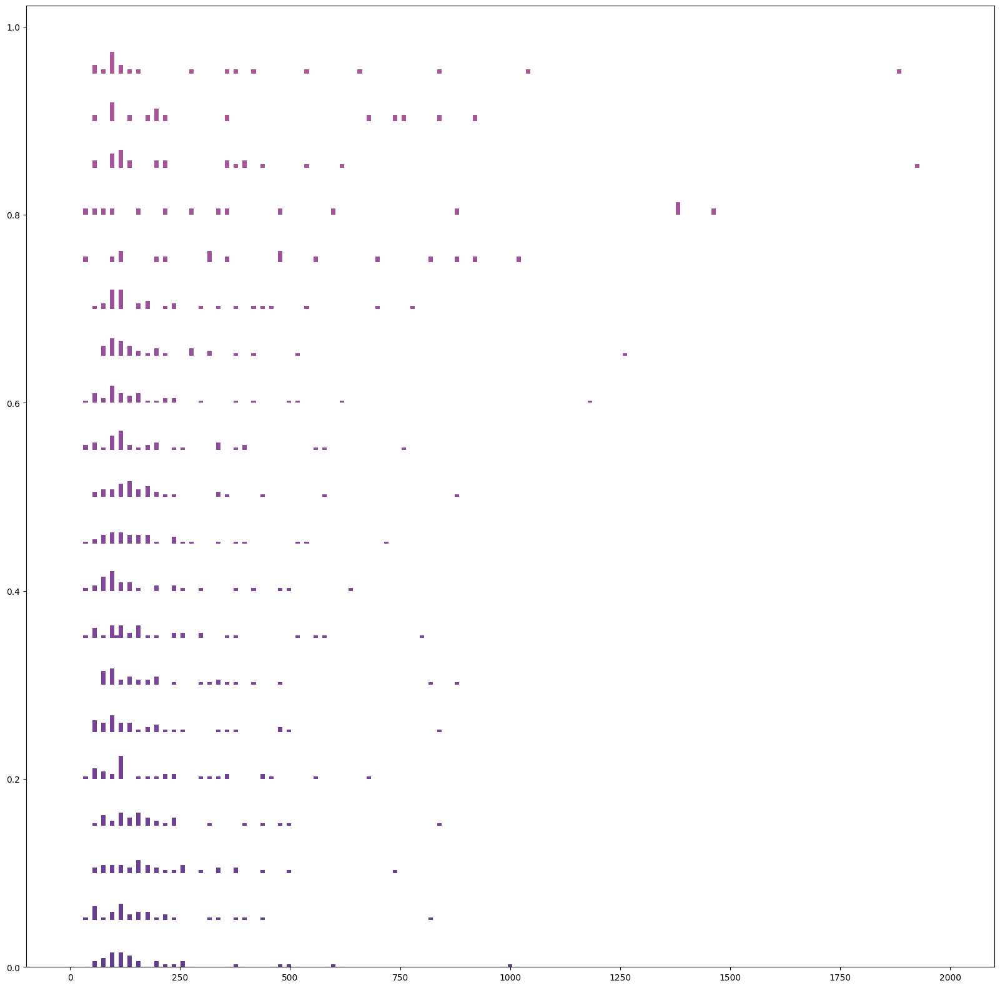

In [16]:
plt.figure(figsize=(20,20))
for i in range(1):
    for j in np.arange(20):
        isiloc = isis[20*i+j]
        plt.hist(isiloc,color=colors[j],alpha=0.8,bottom = 1*i+0.05*j,density=True,bins=np.linspace(0,2000,200))
plt.show()

In [17]:
#run to generate the isi histogram array for linear regression
isinp = np.zeros((len(isis),200))
print(isinp.shape)
for i in range(len(isis)):
    hist, _ = np.histogram(isis[i],bins=200,range=(0,2000))
    isinp[i,:] = hist

(1000, 200)


In [18]:
#saving
fftsSignp = np.array(fftsorig)
fftsSpikenp = np.array(fftsspikes)
labelsnp = np.array(labels_coll).reshape(len(labels_coll),1)
np.save('fftsSig',fftsSignp)
np.save('fftsSpike', fftsSpikenp)
np.save('isis', isinp)
np.save('labels',labelsnp)

In [ ]:
from torch.autograd import Variable

x_data = Variable(torch.Tensor(isinp))
y_data = Variable(torch.Tensor(np.array(labels_coll).reshape(len(labels_coll),1)))

class LinearRegressionModel(torch.nn.Module):
 
    def __init__(self):
        super(LinearRegressionModel, self).__init__()
        self.linear = torch.nn.Linear(200, 1)
 
    def forward(self, x):
        y_pred = self.linear(x)
        return y_pred

LR = LinearRegressionModel()

criterion = torch.nn.MSELoss(size_average = False)
optimizer = torch.optim.Adam(LR.parameters(), lr = 0.1)

for epoch in range(1000):
    # Forward pass: Compute predicted y by passing
    # x to the model
    pred_y = LR(x_data)
 
    # Compute and print loss
    loss = criterion(pred_y, y_data)
 
    # Zero gradients, perform a backward pass,
    # and update the weights.
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    print('epoch {}, loss {}'.format(epoch, loss.item()))

## Dataset import from [VibTac12](https://ieee-dataport.org/open-access/vibtac-12-texture-dataset-collected-tactile-sensors)

There are four CSV files (X, Y, Z, and S) in the dataset corresponding to the sensor recordings. The 3-dimensional accelerometer sensor recordings are denoted by X, Y, and Z, respectively. The sound recordings from the electret condenser microphone are denoted by S. As there are 12 classes in the dataset, there is one line for each class in the CSV files. For each texture, 20 seconds of recordings are collected. Therefore, each line in the X, Y, Z files has 4,000 samples (20 sec x 200Hz sampling rate) and each line in the S file has 160,000 samples (20 sec x 8 kHz). The training and test sets for the machine learning classifiers can be created by snipping short frames out of these recordings and applying signal feature extraction. For example, the first 400 columns of the 12th row of X.csv and the first 16,000 columns of the 12th row of S.csv both correspond to the first 2 seconds of the recordings for texture class 12. The Python programs we have developed will be made available upon request.

In [ ]:
import csv
import numpy as np

with open('texture_dataset/S.csv', newline='') as csvfile:
    data = list(csv.reader(csvfile))
sampling = 8e3
data = np.array(data).astype(np.float32)

## Approach N.1 - Naive Peak Detector

In [ ]:
from scipy.signal import find_peaks
distance_spikes = 10e-3
samples = 100
sample_size = int(data.shape[1]/samples)
parameters['clock_sim'] = 1/sampling
spike_coll = []
labels_coll = []
fig1,axis1 = plt.subplots(1,1)
colors = plt.cm.get_cmap('magma')(np.linspace(0.2,0.8,12))
for i in range(0,12):
    for sample_idx in range(2):
        peaks, _ = find_peaks(data[i,sample_idx*sample_size:(sample_idx+1)*sample_size], height=0, distance=int(distance_spikes*sampling))
        peaks_neg, _ = find_peaks(-data[i,sample_idx*sample_size:(sample_idx+1)*sample_size], height=0, distance=int(distance_spikes*sampling))
        peaks = np.append(peaks,peaks_neg)
        peaks = np.sort(peaks)
        peaks = torch.tensor(peaks)
        spike_coll.append(torch.sparse_coo_tensor(peaks.unsqueeze(0),torch.ones_like(peaks),size=([sample_size])).to_dense())
        labels_coll.append(i)
        myfft = np.fft.rfft(data[i][sample_idx*sample_size:(sample_idx+1)*sample_size])
        myfft_freq = np.fft.rfftfreq(len(myfft),d=1/sampling)
        axis1.plot(np.abs(myfft)/np.abs(myfft).max() + sample_idx*0.01 + i*samples*0.01,color = colors[i],alpha = 0.8)
in_spikes_t = torch.stack(spike_coll,dim=0)
in_spikes_t = in_spikes_t.T.unsqueeze(2)*torch.ones((1,1,parameters['neurons_n']))
sim_time = in_spikes_t.shape[0]*parameters['clock_sim']
in_spikes_t[in_spikes_t>0] = 1
in_spikes_t = in_spikes_t.to(parameters['device'])
print(in_spikes_t.shape)
print(sim_time)



## Approach N.2 - Low Passed Peak Detector

In [ ]:
import numpy as np
from scipy.signal import butter,filtfilt
# Filter requirements.
T = 5.0         # Sample Period
fs = 30.0       # sample rate, Hz
cutoff = 2      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
  # Nyquist Frequency
order = 2       # sin wave can be approx represented as quadratic
n = int(T * fs) # total number of samples

def butter_lowpass_filter(data, cutoff, fs, order):
    nyq = 0.5 * fs
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y
colors = plt.cm.get_cmap('viridis')(np.linspace(0.2,0.8,12))
fig1,axis1 = plt.subplots(data.shape[0],1,figsize=(10,10))
y = np.zeros_like(data)
for neuron in range(data.shape[0]):
    y[neuron,:] = butter_lowpass_filter(data[neuron], 300, 1/parameters['clock_sim'], 1)
    axis1[neuron].plot(data[neuron],color='gray',alpha = 0.8,linestyle='--')
    axis1[neuron].plot(y[neuron],color=colors[neuron],alpha = 1)

samples = 1
sample_size = int(data.shape[1]/samples)
colors = plt.cm.get_cmap('magma')(np.linspace(0.2,0.8,12))
fig4,axis4 = plt.subplots(2,1,figsize=(40,40))
for stimulus in range(12):
    for sample_idx in range(samples):
        peaks,_ = find_peaks(y[stimulus][sample_idx*sample_size:(sample_idx+1)*sample_size], height=0, distance=int(10e-3*sampling))
        isi = np.diff(peaks)
        axis4[0].plot(peaks[:-1],1/isi,color = colors[stimulus],alpha = 1)
        myfft = np.fft.rfft(y[stimulus][sample_idx*sample_size:(sample_idx+1)*sample_size])
        myfft_freq = np.fft.rfftfreq(len(myfft),d=1/sampling)
        axis4[1].plot(np.abs(myfft)/np.abs(myfft).max() + sample_idx*0.01 + stimulus*samples*0.01,color = colors[stimulus],alpha = 0.8)
#
# y = butter_lowpass_filter(data[0], 300, 1/parameters['clock_sim'], 1)
# plt.plot(y,alpha=0.5,color='red',label='filtered')
# plt.legend()

## Approach N.3 ALIF neurons

In [ ]:
class ALIF_neuron(nn.Module):
    NeuronState = namedtuple('NeuronState', ['V', 'I','count_refr', 'Vthr'])

    def __init__(self, parameters):
        super(ALIF_neuron, self).__init__()
        self.C = parameters['C_Osc']
        self.thr = parameters['v_Osc_threshold']
        self.state = None
        self.bs = parameters['trials_per_stimulus']
        self.n = parameters['neurons_n']
        self.tau_syn = parameters['tau_Osc_Ie']
        self.tau_neu = parameters['tau_Osc']
        self.gain_syn = parameters['TDE_to_Osc_current']
        self.dt = parameters['clock_sim']
        self.Vr = parameters['reset_osc']
        self.device = parameters['device']
        self.I_minimum_osc = parameters['I_minimum_osc']
        self.I_step_osc = parameters['I_step_osc']
        self.refrac_Osc = parameters['refrac_Osc']
        self.steady_current = torch.tensor([self.I_minimum_osc + self.I_step_osc * i for i in range(self.n)]).to(self.device)
        self.refr = self.refrac_Osc/self.dt
        self.tau_adpt = parameters['tau_adpt']
        self.thr_jump = parameters['thr_jump']

    def initialize_state(self,parameters):
        self.state = None
        self.bs = parameters['trials_per_stimulus']
    def forward(self, input):
        if self.state is None:
            self.state = self.NeuronState(V=torch.ones((self.bs,self.n), device=input.device),
                                          I=torch.zeros((self.bs,self.n), device=input.device),
                                          Vthr=torch.ones((self.bs,self.n), device=input.device)*self.thr,
                                          count_refr = torch.zeros((self.bs,self.n), device=input.device)
                                          )
        V = self.state.V
        I = self.state.I
        Vthr = self.state.Vthr
        count_refr = self.state.count_refr
        I += -self.dt * I / self.tau_syn + self.gain_syn * input
        V += self.dt * (-V / self.tau_neu + (I + self.steady_current) / self.C)
        spk = activation(V - Vthr)
        Vthr += self.dt* (-(self.thr-Vthr)/self.tau_adpt + self.thr_jump * spk)
        count_refr = self.refr*(spk) + (1-spk)*(count_refr-1)
        V = (1 - spk) * V * (count_refr <= 0) + spk * self.Vr
        self.state = self.NeuronState(V=V, I=I,count_refr = count_refr,Vthr=Vthr)
        return spk

In [ ]:
parameters_enc = parameters.copy()
parameters_enc['C_Osc'] = 1
parameters_enc['v_Osc_threshold'] = 1
parameters_enc['tau_Osc_Ie'] = 100e-3
parameters_enc['tau_Osc'] = 100e-3
parameters_enc['TDE_to_Osc_current'] = 5
parameters_enc['reset_osc'] = 0
parameters_enc['I_minimum_osc'] = 0
parameters_enc['I_step_osc'] = 0
parameters_enc['refrac_Osc'] = 1e-3
parameters_enc['trials_per_stimulus'] = 1
parameters_enc['neurons_n'] = data.shape[0]
parameters_enc['tau_adpt'] = 10e-3
parameters_enc['thr_jump'] = 0.1
# parameters_enc['neurons_n'] = 1
ALIF_enc = ALIF_neuron(parameters_enc).to(parameters_enc['device'])
spk_list = []
thr_list = []
data = torch.tensor(data).to(parameters_enc['device'])
for t in range(data.shape[1]):
    spk = ALIF_enc(data[:,t]*100)
    spk_list.append(spk)
    thr_list.append(ALIF_enc.state.Vthr)
    # print(t)
spk_enc = torch.stack(spk_list)[:,0,:]
thr_list = torch.stack(thr_list)[:,0,:]
print(spk_enc.shape)
events_enc = torch.where(spk_enc)
plt.scatter(events_enc[0],events_enc[1],s=0.1)
fig1,axis1 = plt.subplots(data.shape[0],1,figsize=(40,40))
fig2,axis2 = plt.subplots(data.shape[0],1,figsize=(5,5))
for neuron in range(data.shape[0]):
    isi = torch.diff(events_enc[0][events_enc[1]==neuron])
    axis3 = axis1[neuron].twinx()
    axis3.plot(data[neuron].cpu().detach().numpy(),color='gray',alpha = 0.5)
    # axis3.plot(thr_list[:,neuron].cpu().detach().numpy(),color='red',alpha = 0.5)
    axis1[neuron].scatter(events_enc[0][events_enc[1]==neuron][:-1],torch.ones_like(events_enc[0][events_enc[1]==neuron][:-1]),s=100,marker='o')
    axis2[neuron].plot(events_enc[0][events_enc[1]==neuron][:-1],isi.cpu().detach().numpy(),alpha=1)

## Feeding the resulting Dataset into the sPLL network

In [22]:
torch.cuda.empty_cache()

In [17]:
#parameters
#parameters = {}
parameters['device'] = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#parameters['device'] = torch.device("cpu")
print('device in use:', parameters['device'])
parameters['neurons_n'] = 50
parameters['frequencies'] = 1
parameters['C_Osc'] = 1
parameters['v_Osc_threshold'] = 1
parameters['tau_Osc_Ie'] = 5e-3
parameters['tau_Osc'] = 100e-3
parameters['TDE_to_Osc_current'] = 3
parameters['reset_osc'] = 0
parameters['I_minimum_osc'] = 12
parameters['I_step_osc'] = 0.5
parameters['refrac_Osc'] = 1e-3
parameters['C_TDE'] = 1
parameters['v_TDE_threshold'] = 1
parameters['tau_trg_TDE'] = 2.5e-3
parameters['tau_fac_TDE'] = 10e-3
parameters['gain_fac_TDE'] = 1
parameters['gain_trg_TDE'] = 100000
parameters['reset_TDE'] = 0
parameters['tau_TDE'] = 10e-3
parameters['refrac_TDE'] = 1e-3
parameters['trials_per_stimulus'] = 1

device in use: cuda:0


In [22]:
parameters['gain_trg_TDE']

100000

In [18]:
spk_tde_t,spk_osc_t,v_tde_t,v_osc_t,i_trg_t,i_fac_t,i_syn_t = sim_sPLL(in_spikes=in_spikes_t,freqs=[i for i in range(in_spikes_t.shape[1])],break_feedback = False,parameters_here=parameters,save_traces=True)

Simulating sPLL: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:02<00:00, 2959.76it/s]


400
5


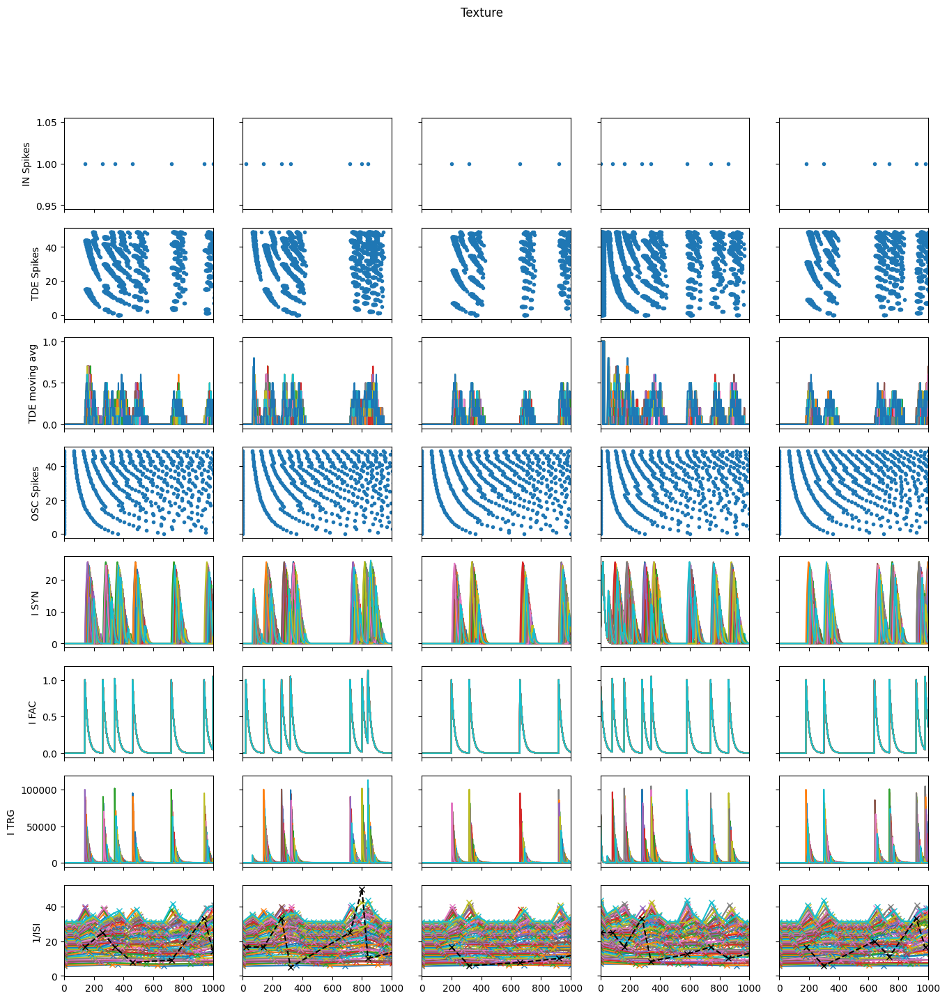

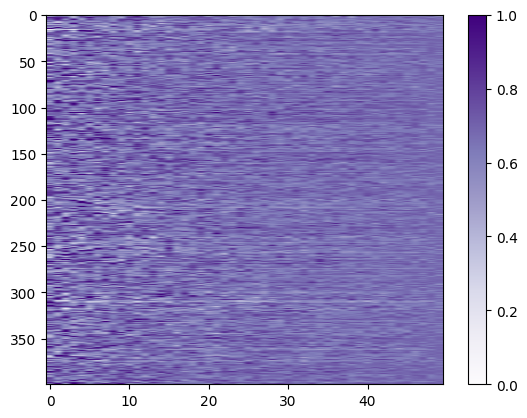

In [19]:
plot_spll_run(in_spikes_t,spk_tde_t,spk_osc_t,i_syn_t,i_fac_t,i_trg_t,[],suptitle='Texture',cmap='Purples',xlims=[0,1000],moving_avg=10)

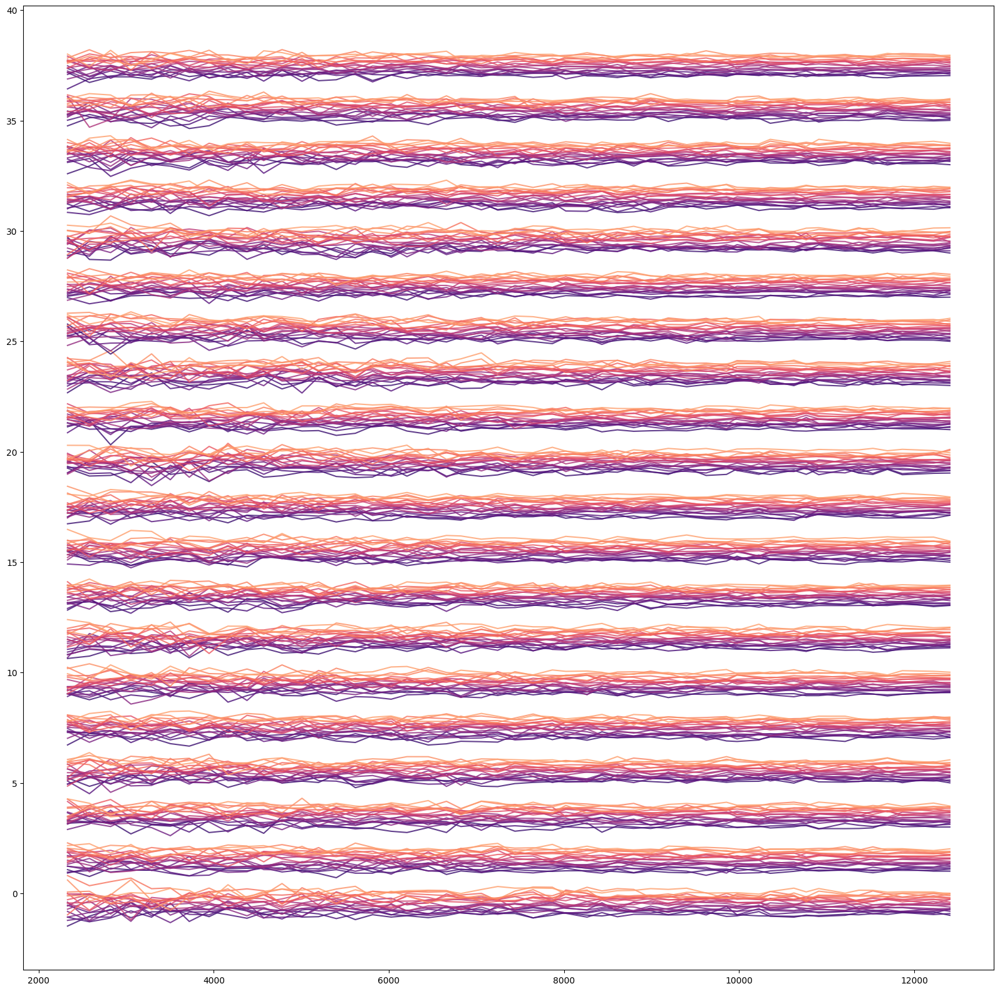

In [22]:
colors = mpl.colormaps['magma'](np.linspace(0.2,0.8,20))
plt.figure(figsize=(20,20))

spk_tde_sum = torch.sum(spk_tde_t,dim=0).cpu().detach().numpy()
spk_tde_sum_norm = spk_tde_sum.T/np.max(spk_tde_sum,axis=1)
spk_tde_sum_norm = spk_tde_sum_norm.T#/basic_freqs
spk_tde_sum_avg = np.average(spk_tde_sum_norm,axis=0)
spk_tde_sum_avg /= np.max(spk_tde_sum_avg)
spk_tde_sum_norm /= spk_tde_sum_avg[None,:]*2


for i in range(20):
    for j in range(20):
        plt.plot(basic_freqs,-2*spk_tde_sum_norm[20*i+j,:]+2*i+0.05*j,c=colors[j],alpha=0.8)
        

torch.Size([400, 49])


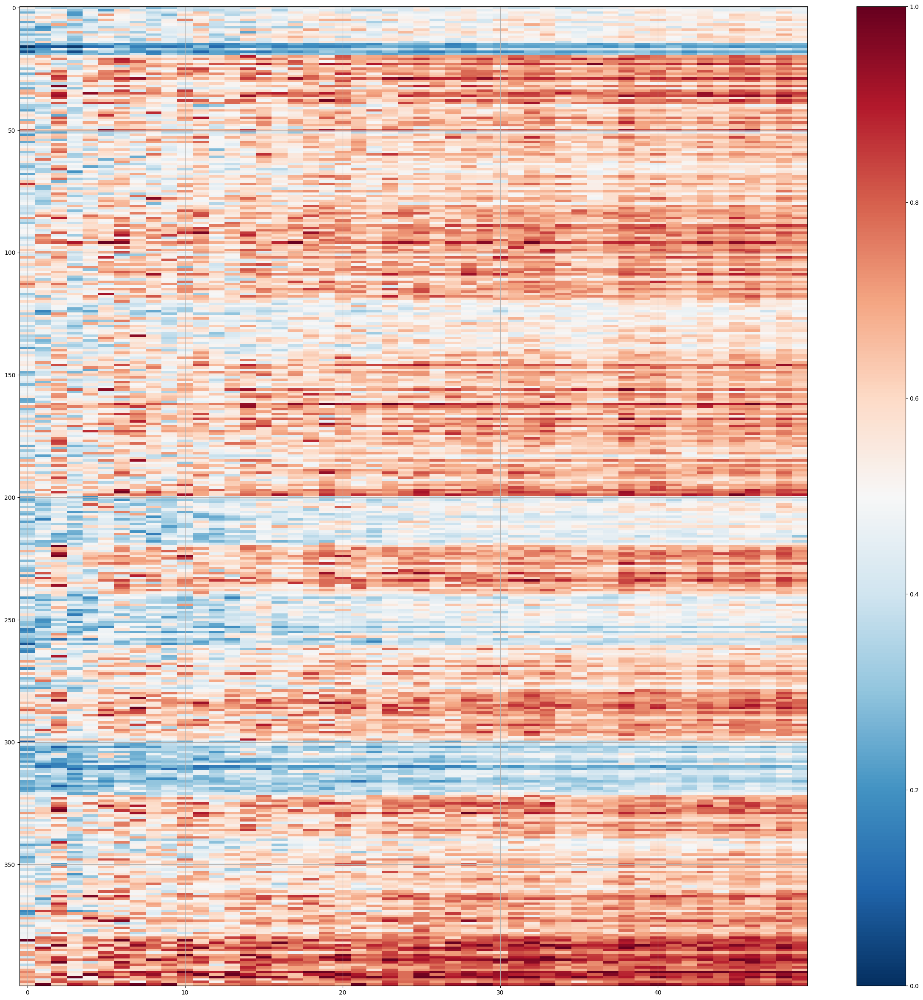

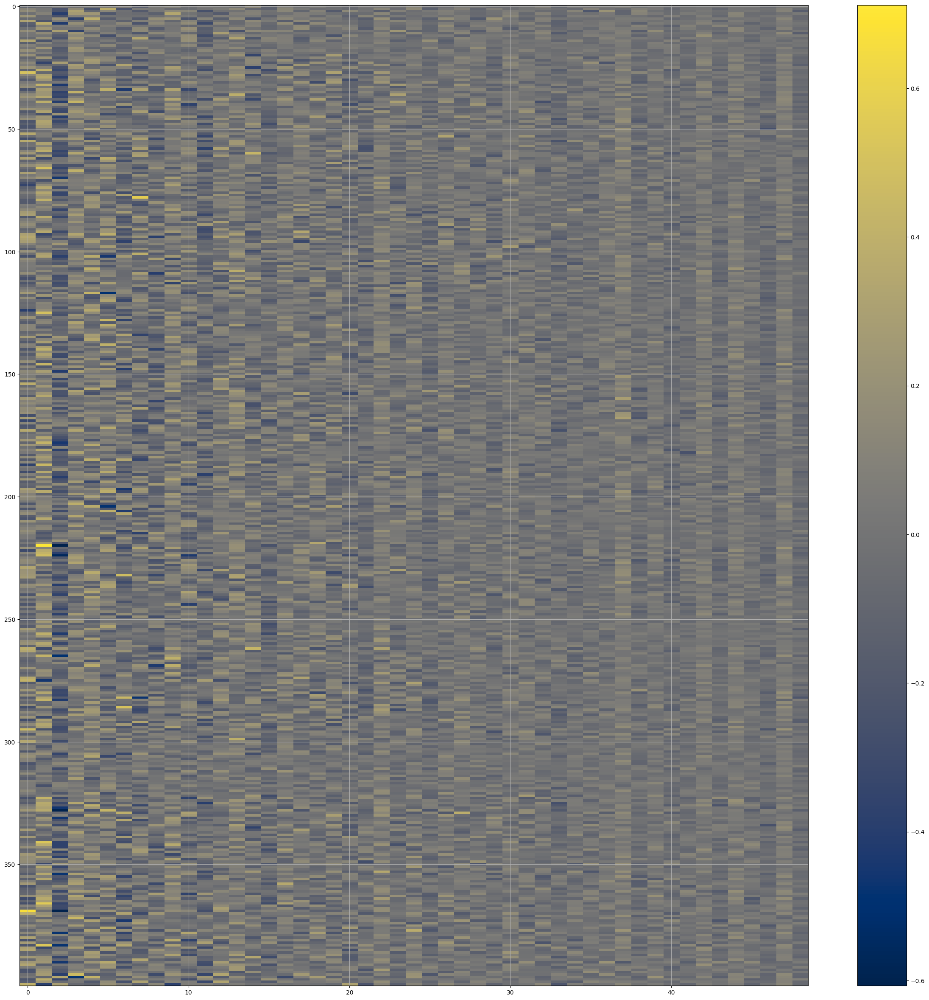

In [23]:
mysum = torch.sum(spk_tde_t,dim=0)
normalized = mysum/np.max(mysum.numpy(),axis=0)
# normalized = normalized.T/torch.tensor(basic_freqs)
plt.figure(figsize=(30,30))
plt.imshow(normalized.cpu().detach().numpy(),aspect='auto',cmap='RdBu_r',interpolation='None')
mydiff = torch.diff(normalized,dim=1)
print(mydiff.shape)
plt.colorbar()
# plt.xlim([10,30])
plt.grid()
plt.figure(figsize=(30,30))
plt.imshow(mydiff.cpu().detach().numpy(),aspect='auto',cmap='cividis',interpolation='None')
plt.colorbar()
plt.grid()

# Simulating Components

Simulating LIF: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:01<00:00, 7408.32it/s]


[2329.450256265208, 2579.721266953106, 2821.6174304362535, 3053.5687094628115, 3289.808311482495, 3504.1298634704735, 3720.2109761134866, 3947.1154152917425, 4162.182740837587, 4379.6790481493035, 4570.594421637486, 4779.811675655313, 5007.887682542977, 5197.1975408416465, 5399.643169501527, 5617.303317152401, 5814.286020715328, 6026.114419701897, 6206.7318748185135, 6449.735113593915, 6658.007257980756, 6822.776604886245, 7057.088991884286, 7243.208463909533, 7439.738067259988, 7647.546549563645, 7867.60757375194, 8020.804380755805, 8263.793646017848, 8433.483976565241, 8610.512640897665, 8796.51075091054, 8989.64629174594, 9191.665233043994, 9402.099718290588, 9623.808960335728, 9856.423395701408, 9977.071831398978, 10226.59426385186, 10356.71276097039, 10626.315134186858, 10767.043592208907, 10910.659914347809, 11210.959536399148, 11367.958017639328, 11528.571889967063, 11694.769424514088, 11865.006336310398, 12221.13681197339, 12407.504166214156]


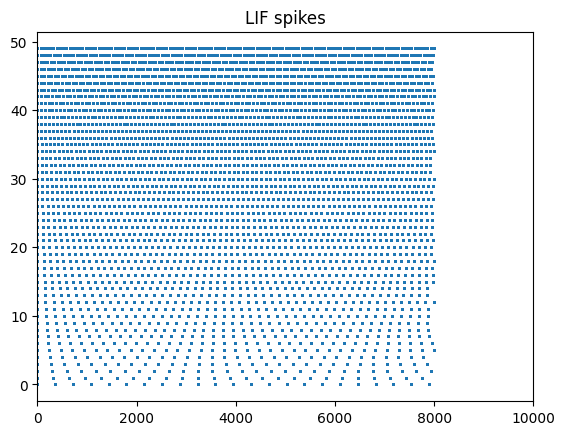

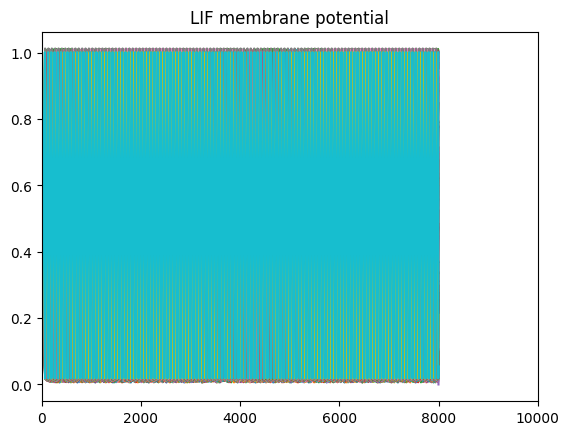

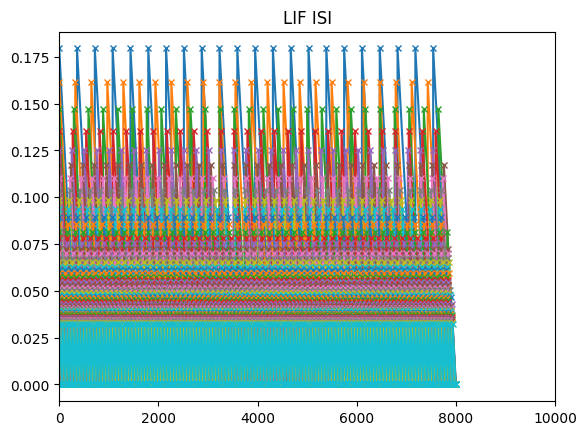

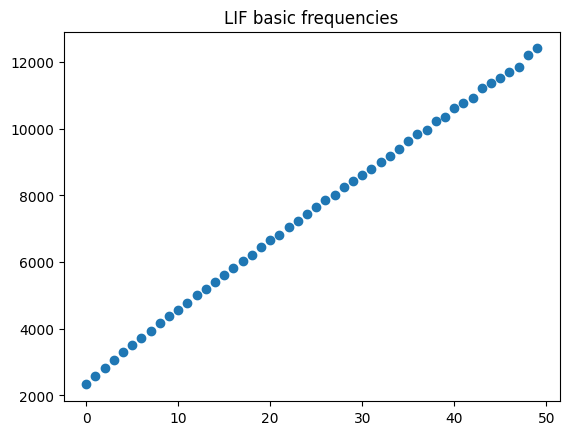

In [20]:
LIF_test = LIF_neuron(parameters).to(parameters['device'])
spk = []
v_mem = []
steady_current = []
myinput = torch.zeros((1,1)).to(parameters['device'])
sim = tqdm.trange(int(sim_time/parameters['clock_sim']), desc='Simulating LIF', leave=True)
with torch.no_grad():
    for i in sim:
        spk.append(LIF_test(myinput))
        v_mem.append(LIF_test.state.V)
        steady_current.append(LIF_test.steady_current)
    spk = torch.stack(spk)
    v_mem = torch.stack(v_mem)
    steady_current = LIF_test.steady_current
    events = torch.where(spk)
plt.scatter(events[0].cpu().detach().numpy(),events[2].cpu().detach().numpy(),s=1)
plt.title('LIF spikes')
plt.xlim([0,10000])
plt.figure()
plt.plot(v_mem[:,0,:].cpu().detach().numpy())
plt.title('LIF membrane potential')
plt.xlim([0,10000])
plt.figure()
plt.title('LIF ISI')
basic_freqs = []
for neu in range(parameters['neurons_n']):
    events_selected = events[0][torch.where(events[2]==neu)]
    isi_osc = torch.diff(events_selected)*parameters['clock_sim']
    plt.plot(events_selected[:-1].cpu().detach().numpy(),isi_osc.cpu().detach().numpy(),marker='x',markersize=5)
    basic_freqs.append(1/torch.mean(isi_osc).cpu().detach().numpy())
plt.xlim([0,10000])
plt.figure()
plt.scatter(range(len(basic_freqs)),basic_freqs)
print(basic_freqs)
plt.title('LIF basic frequencies')
torch.cuda.empty_cache()
plt.show()

In [21]:
TDE_test = TDE(parameters)
fac_spikes = torch.zeros((int(sim_time/parameters['clock_sim']),1,parameters['neurons_n'])).to(parameters['device'])
trg_spikes = torch.zeros((int(sim_time/parameters['clock_sim']),1,parameters['neurons_n'])).to(parameters['device'])
fac_spikes[int(0.5*sim_time/parameters['clock_sim']),:] = 1
shift = 1e-2
shift = int(shift/parameters['clock_sim'])
offset = int(sim_time/(2*parameters['clock_sim']) - shift*fac_spikes.shape[2]/2)

for i in range(parameters['neurons_n']):
    trg_spikes[i*shift+offset,:,i] = 1

spk = []
v_mem = []
i_trg = []
i_fac = []
sim = tqdm.trange(int(sim_time/parameters['clock_sim']), desc='Simulating TDE', leave=True)
with torch.no_grad():
    for i in sim:
        spk.append(TDE_test(trg_spikes[i,:],fac_spikes[i,:]))
        v_mem.append(TDE_test.state.v)
        i_trg.append(TDE_test.state.i_trg)
        i_fac.append(TDE_test.state.i_fac)
    spk = torch.stack(spk)
    v_mem = torch.stack(v_mem)
    i_trg = torch.stack(i_trg)
    i_fac = torch.stack(i_fac)
    events_tde = torch.where(spk)
    events_fac = torch.where(fac_spikes)
    events_trg = torch.where(trg_spikes)
plt.scatter(events_fac[0].cpu().detach().numpy(),events_fac[2].cpu().detach().numpy())
plt.figure()
plt.scatter(events_trg[0].cpu().detach().numpy(),events_trg[2].cpu().detach().numpy())
plt.figure()
plt.scatter(events_tde[0].cpu().detach().numpy(),events_tde[2].cpu().detach().numpy())
plt.figure()
plt.plot(v_mem[:,0,:].cpu().detach().numpy())
plt.figure()
plt.plot(i_trg[:,0,:].cpu().detach().numpy())
plt.figure()
plt.plot(i_fac[:,0,:].cpu().detach().numpy())
plt.figure()
plt.bar([i for i in range(parameters['neurons_n'])],torch.sum(spk[:,0,:],dim=0).cpu().detach().numpy())
plt.xticks([i for i in range(parameters['neurons_n'])][::10],[int(0.5*sim_time) - (offset+i*shift)*parameters['clock_sim'] for i in range(parameters['neurons_n'])][::10])
torch.cuda.empty_cache()
plt.show()

Simulating TDE: 100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8000/8000 [00:01<00:00, 5765.34it/s]


RuntimeError: stack expects each tensor to be equal size, but got [1, 50] at entry 0 and [400, 50] at entry 1